In [98]:
import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.offline as py
import plotly.graph_objs as go

In [2]:
data = pd.read_excel('resturant.xlsx')

In [3]:
data

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800.0,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800.0,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800.0,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300.0,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600.0,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51712,https://www.zomato.com/bangalore/best-brews-fo...,"Four Points by Sheraton Bengaluru, 43/3, White...",Best Brews - Four Points by Sheraton Bengaluru...,No,No,3.6 /5,27,080 40301477,Whitefield,Bar,NaN,Continental,1500.0,"[('Rated 5.0', ""RATED\n Food and service are ...",[],Pubs and bars,Whitefield
51713,https://www.zomato.com/bangalore/vinod-bar-and...,"Number 10, Garudachar Palya, Mahadevapura, Whi...",Vinod Bar And Restaurant,No,No,NaN,0,+91 8197675843,Whitefield,Bar,NaN,Finger Food,600.0,[],[],Pubs and bars,Whitefield
51714,https://www.zomato.com/bangalore/plunge-sherat...,Sheraton Grand Bengaluru Whitefield Hotel & Co...,Plunge - Sheraton Grand Bengaluru Whitefield H...,No,No,NaN,0,NaN,Whitefield,Bar,NaN,Finger Food,2000.0,[],[],Pubs and bars,Whitefield
51715,https://www.zomato.com/bangalore/chime-sherato...,Sheraton Grand Bengaluru Whitefield Hotel & Co...,Chime - Sheraton Grand Bengaluru Whitefield Ho...,No,Yes,4.3 /5,236,080 49652769,"ITPL Main Road, Whitefield",Bar,"Cocktails, Pizza, Buttermilk",Finger Food,2500.0,"[('Rated 4.0', 'RATED\n Nice and friendly pla...",[],Pubs and bars,Whitefield


In [4]:
data.columns

Index(['url', 'address', 'name', 'online_order', 'book_table', 'rate', 'votes',
       'phone', 'location', 'rest_type', 'dish_liked', 'cuisines',
       'approx_cost(for two people)', 'reviews_list', 'menu_item',
       'listed_in(type)', 'listed_in(city)'],
      dtype='object')

In [5]:
len(data.columns)

17

In [6]:
data.drop(['url','address','phone','reviews_list','menu_item','listed_in(city)'],inplace=True,axis=1)

In [7]:
len(data.columns)

11

In [8]:
data.shape

(51717, 11)

In [9]:
data.duplicated().sum()

16608

In [10]:
after_dropping_duplicates=data.drop_duplicates()

In [11]:
after_dropping_duplicates

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,approx_cost(for two people),listed_in(type)
0,Jalsa,Yes,Yes,4.1/5,775,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800.0,Buffet
1,Spice Elephant,Yes,No,4.1/5,787,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800.0,Buffet
2,San Churro Cafe,Yes,No,3.8/5,918,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800.0,Buffet
3,Addhuri Udupi Bhojana,No,No,3.7/5,88,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300.0,Buffet
4,Grand Village,No,No,3.8/5,166,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600.0,Buffet
...,...,...,...,...,...,...,...,...,...,...,...
51712,Best Brews - Four Points by Sheraton Bengaluru...,No,No,3.6 /5,27,Whitefield,Bar,NaN,Continental,1500.0,Pubs and bars
51713,Vinod Bar And Restaurant,No,No,NaN,0,Whitefield,Bar,NaN,Finger Food,600.0,Pubs and bars
51714,Plunge - Sheraton Grand Bengaluru Whitefield H...,No,No,NaN,0,Whitefield,Bar,NaN,Finger Food,2000.0,Pubs and bars
51715,Chime - Sheraton Grand Bengaluru Whitefield Ho...,No,Yes,4.3 /5,236,"ITPL Main Road, Whitefield",Bar,"Cocktails, Pizza, Buttermilk",Finger Food,2500.0,Pubs and bars


In [12]:
after_dropping_duplicates.shape

(35109, 11)

In [13]:
after_dropping_duplicates.info()

<class 'pandas.core.frame.DataFrame'>
Index: 35109 entries, 0 to 51716
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   name                         35109 non-null  object 
 1   online_order                 35109 non-null  object 
 2   book_table                   35109 non-null  object 
 3   rate                         31339 non-null  object 
 4   votes                        35109 non-null  int64  
 5   location                     35095 non-null  object 
 6   rest_type                    34953 non-null  object 
 7   dish_liked                   18102 non-null  object 
 8   cuisines                     35076 non-null  object 
 9   approx_cost(for two people)  34888 non-null  float64
 10  listed_in(type)              35109 non-null  object 
dtypes: float64(1), int64(1), object(9)
memory usage: 3.2+ MB


In [14]:
after_dropping_duplicates['name'][:20]

0                                                 Jalsa
1                                        Spice Elephant
2                                       San Churro Cafe
3                                 Addhuri Udupi Bhojana
4                                         Grand Village
5                                       Timepass Dinner
6       Rosewood International Hotel - Bar & Restaurant
7                                                Onesta
8                                        Penthouse Cafe
9                                             Smacznego
10    CafÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂ© Down The A...
11                                         Cafe Shuffle
12                                     The Coffee Shack
13                                           Caf-Eleven
14                                      San Churro Cafe
15                                        Cafe Vivacity
16                                         Catch-up-ino
17                                     Kirthi's 

In [15]:
after_dropping_duplicates['name'].iloc[10].replace('\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x83Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â©','')

'CafÃ Down The Alley'

In [16]:
 isinstance("12",int)

False

In [17]:
def clean_rest_name(name):
    if isinstance(name,str):
        if re.findall(r'[a-zA-Z0-9 ]',name):
            list_name = re.findall(r'[a-zA-Z0-9 ]',name)
        string_name = "".join(list_name)
        return string_name
    else:
        return name

In [18]:
after_dropping_duplicates['name'] = after_dropping_duplicates['name'].apply(clean_rest_name)

C:\Users\tarun raghuvanshi\AppData\Local\Temp\ipykernel_4912\2252155224.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after_dropping_duplicates['name'] = after_dropping_duplicates['name'].apply(clean_rest_name)


In [19]:
after_dropping_duplicates['name'][1750:1800]

1751                          Arzak
1752       Furry Fairy Paw Paradise
1753                          Petoo
1754                    Night Panda
1755                    Spicy Grill
1756                E2  Entre Envoy
1757                  Aha Juice Bar
1758    Cafe Club Kerala Restaurant
1759                 Cake N Cookies
1760                 Bright Go Nuts
1761                Hotel Namadhari
1762             Nammuru Nati Hotel
1763                     3ice Cubes
1764               Tasty Restaurant
1765                   Hotel Ambara
1766                  Biryani Treat
1767                   Best Biryani
1768                         Innate
1769                  Tandoori Spot
1770                   Night Hunger
1771         Santhrupthi Halli Mane
1772                Iyengars Bakery
1773                      Nutri Fit
1774                New Kabab Plaza
1775               Padosi Apke Apne
1776                Grill On Wheels
1777                 Charcoal Flame
1778                   Chick

In [20]:
after_dropping_duplicates.head()

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,approx_cost(for two people),listed_in(type)
0,Jalsa,Yes,Yes,4.1/5,775,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800.0,Buffet
1,Spice Elephant,Yes,No,4.1/5,787,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800.0,Buffet
2,San Churro Cafe,Yes,No,3.8/5,918,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800.0,Buffet
3,Addhuri Udupi Bhojana,No,No,3.7/5,88,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300.0,Buffet
4,Grand Village,No,No,3.8/5,166,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600.0,Buffet


In [21]:
after_dropping_duplicates['online_order'].value_counts()

online_order
Yes    20886
No     14223
Name: count, dtype: int64

**Around 20k resturants in banglore provides online orders**

**around 14k resturant in banglore are not provides online order**

In [22]:
after_dropping_duplicates['book_table'].value_counts()

book_table
No     29675
Yes     5434
Name: count, dtype: int64

**Around 29k resturant in banglore are not take advance booking_table**

**Around 5k resturant in banglore are take advance booking_table**

In [23]:
after_dropping_duplicates['rate'].unique()

array(['4.1/5', '3.8/5', '3.7/5', '3.6/5', '4.6/5', '4.0/5', '4.2/5',
       '3.9/5', '3.1/5', '3.0/5', '3.2/5', '3.3/5', '2.8/5', '4.4/5',
       '4.3/5', 'NEW', '2.9/5', '3.5/5', nan, '2.6/5', '3.8 /5', '3.4/5',
       '4.5/5', '2.5/5', '2.7/5', '4.7/5', '2.4/5', '2.2/5', '2.3/5',
       '3.4 /5', '-', '3.6 /5', '4.8/5', '3.9 /5', '4.2 /5', '4.0 /5',
       '4.1 /5', '3.7 /5', '3.1 /5', '2.9 /5', '3.3 /5', '2.8 /5',
       '3.5 /5', '2.7 /5', '2.5 /5', '3.2 /5', '2.6 /5', '4.5 /5',
       '4.3 /5', '4.4 /5', '4.9/5', '2.1/5', '2.0/5', '1.8/5', '4.6 /5',
       '4.9 /5', '3.0 /5', '4.8 /5', '2.3 /5', '4.7 /5', '2.4 /5',
       '2.1 /5', '2.2 /5', '2.0 /5', '1.8 /5'], dtype=object)

In [24]:
float('4.1/5'.split('/')[0])

4.1

In [25]:
def rate_clean(rates):
    #print(type(rates))
    if rates == "NEW" or rates == "-":
        return np.nan
    else:
        new_rate = float(str(rates).split('/')[0])
        return new_rate

In [26]:
after_dropping_duplicates['rate'] = after_dropping_duplicates['rate'].apply(rate_clean)

C:\Users\tarun raghuvanshi\AppData\Local\Temp\ipykernel_4912\1858488261.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after_dropping_duplicates['rate'] = after_dropping_duplicates['rate'].apply(rate_clean)


In [27]:
after_dropping_duplicates['rate']

0        4.1
1        4.1
2        3.8
3        3.7
4        3.8
        ... 
51712    3.6
51713    NaN
51714    NaN
51715    4.3
51716    3.4
Name: rate, Length: 35109, dtype: float64

In [28]:
after_dropping_duplicates

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,approx_cost(for two people),listed_in(type)
0,Jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800.0,Buffet
1,Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800.0,Buffet
2,San Churro Cafe,Yes,No,3.8,918,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800.0,Buffet
3,Addhuri Udupi Bhojana,No,No,3.7,88,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300.0,Buffet
4,Grand Village,No,No,3.8,166,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600.0,Buffet
...,...,...,...,...,...,...,...,...,...,...,...
51712,Best Brews Four Points by Sheraton Bengaluru,No,No,3.6,27,Whitefield,Bar,NaN,Continental,1500.0,Pubs and bars
51713,Vinod Bar And Restaurant,No,No,NaN,0,Whitefield,Bar,NaN,Finger Food,600.0,Pubs and bars
51714,Plunge Sheraton Grand Bengaluru Whitefield Ho...,No,No,NaN,0,Whitefield,Bar,NaN,Finger Food,2000.0,Pubs and bars
51715,Chime Sheraton Grand Bengaluru Whitefield Hotel,No,Yes,4.3,236,"ITPL Main Road, Whitefield",Bar,"Cocktails, Pizza, Buttermilk",Finger Food,2500.0,Pubs and bars


In [29]:
after_dropping_duplicates['rate'].mean()

3.731078872769718

In [30]:
after_dropping_duplicates['rate'].fillna(after_dropping_duplicates['rate'].mean(),inplace=True)

C:\Users\tarun raghuvanshi\AppData\Local\Temp\ipykernel_4912\3577323703.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after_dropping_duplicates['rate'].fillna(after_dropping_duplicates['rate'].mean(),inplace=True)


In [31]:
after_dropping_duplicates

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,approx_cost(for two people),listed_in(type)
0,Jalsa,Yes,Yes,4.100000,775,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800.0,Buffet
1,Spice Elephant,Yes,No,4.100000,787,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800.0,Buffet
2,San Churro Cafe,Yes,No,3.800000,918,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800.0,Buffet
3,Addhuri Udupi Bhojana,No,No,3.700000,88,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300.0,Buffet
4,Grand Village,No,No,3.800000,166,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600.0,Buffet
...,...,...,...,...,...,...,...,...,...,...,...
51712,Best Brews Four Points by Sheraton Bengaluru,No,No,3.600000,27,Whitefield,Bar,NaN,Continental,1500.0,Pubs and bars
51713,Vinod Bar And Restaurant,No,No,3.731079,0,Whitefield,Bar,NaN,Finger Food,600.0,Pubs and bars
51714,Plunge Sheraton Grand Bengaluru Whitefield Ho...,No,No,3.731079,0,Whitefield,Bar,NaN,Finger Food,2000.0,Pubs and bars
51715,Chime Sheraton Grand Bengaluru Whitefield Hotel,No,Yes,4.300000,236,"ITPL Main Road, Whitefield",Bar,"Cocktails, Pizza, Buttermilk",Finger Food,2500.0,Pubs and bars


In [32]:
after_dropping_duplicates['rate'] = round(after_dropping_duplicates['rate'],1)

C:\Users\tarun raghuvanshi\AppData\Local\Temp\ipykernel_4912\3878980794.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after_dropping_duplicates['rate'] = round(after_dropping_duplicates['rate'],1)


In [33]:
after_dropping_duplicates

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,approx_cost(for two people),listed_in(type)
0,Jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800.0,Buffet
1,Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800.0,Buffet
2,San Churro Cafe,Yes,No,3.8,918,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800.0,Buffet
3,Addhuri Udupi Bhojana,No,No,3.7,88,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300.0,Buffet
4,Grand Village,No,No,3.8,166,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600.0,Buffet
...,...,...,...,...,...,...,...,...,...,...,...
51712,Best Brews Four Points by Sheraton Bengaluru,No,No,3.6,27,Whitefield,Bar,NaN,Continental,1500.0,Pubs and bars
51713,Vinod Bar And Restaurant,No,No,3.7,0,Whitefield,Bar,NaN,Finger Food,600.0,Pubs and bars
51714,Plunge Sheraton Grand Bengaluru Whitefield Ho...,No,No,3.7,0,Whitefield,Bar,NaN,Finger Food,2000.0,Pubs and bars
51715,Chime Sheraton Grand Bengaluru Whitefield Hotel,No,Yes,4.3,236,"ITPL Main Road, Whitefield",Bar,"Cocktails, Pizza, Buttermilk",Finger Food,2500.0,Pubs and bars


In [34]:
after_dropping_duplicates.groupby('rest_type').agg({'rate':'mean'})[0:20]

,rate
rest_type,
Bakery,3.635462
"Bakery, Beverage Shop",3.600000
"Bakery, Cafe",3.976056
"Bakery, Dessert Parlor",3.698000
"Bakery, Food Court",3.100000
"Bakery, Kiosk",3.700000
"Bakery, Quick Bites",3.439548
"Bakery, Sweet Shop",3.700000
Bar,3.788174


In [35]:
after_dropping_duplicates[0:20]

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,approx_cost(for two people),listed_in(type)
0,Jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800.0,Buffet
1,Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800.0,Buffet
2,San Churro Cafe,Yes,No,3.8,918,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800.0,Buffet
3,Addhuri Udupi Bhojana,No,No,3.7,88,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300.0,Buffet
4,Grand Village,No,No,3.8,166,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600.0,Buffet
5,Timepass Dinner,Yes,No,3.8,286,Basavanagudi,Casual Dining,"Onion Rings, Pasta, Kadhai Paneer, Salads, Sal...",North Indian,600.0,Buffet
6,Rosewood International Hotel Bar Restaurant,No,No,3.6,8,Mysore Road,Casual Dining,NaN,"North Indian, South Indian, Andhra, Chinese",800.0,Buffet
7,Onesta,Yes,Yes,4.6,2556,Banashankari,"Casual Dining, Cafe","Farmhouse Pizza, Chocolate Banana, Virgin Moji...","Pizza, Cafe, Italian",600.0,Cafes
8,Penthouse Cafe,Yes,No,4.0,324,Banashankari,Cafe,"Pizza, Mocktails, Coffee, Nachos, Salad, Pasta...","Cafe, Italian, Continental",700.0,Cafes
9,Smacznego,Yes,No,4.2,504,Banashankari,Cafe,"Waffles, Pasta, Coleslaw Sandwich, Choco Waffl...","Cafe, Mexican, Italian, Momos, Beverages",550.0,Cafes


In [36]:
pd.set_option('display.max_rows',None)

In [37]:
after_dropping_duplicates['location'].value_counts()

location
BTM                              2520
Whitefield                       1972
Indiranagar                      1792
HSR                              1774
Marathahalli                     1683
Koramangala 5th Block            1623
JP Nagar                         1426
Jayanagar                        1253
Electronic City                  1222
Bellandur                        1138
Bannerghatta Road                1064
Sarjapur Road                     950
Brigade Road                      690
Koramangala 7th Block             628
Koramangala 6th Block             607
Brookefield                       600
Kalyan Nagar                      595
Koramangala 4th Block             589
New BEL Road                      586
Banashankari                      574
MG Road                           573
Malleshwaram                      557
Ulsoor                            552
Koramangala 1st Block             542
Frazer Town                       476
Basavanagudi                      463
Raj

In [38]:
after_dropping_duplicates['location'].unique()

array(['Banashankari', 'Basavanagudi', 'Mysore Road', 'Jayanagar',
       'Kumaraswamy Layout', 'Rajarajeshwari Nagar', 'Vijay Nagar',
       'Uttarahalli', 'JP Nagar', 'South Bangalore', 'City Market',
       'Nagarbhavi', 'Bannerghatta Road', 'BTM', 'Kanakapura Road',
       'Bommanahalli', nan, 'CV Raman Nagar', 'Electronic City', 'HSR',
       'Marathahalli', 'Sarjapur Road', 'Wilson Garden', 'Shanti Nagar',
       'Koramangala 5th Block', 'Koramangala 8th Block', 'Richmond Road',
       'Koramangala 7th Block', 'Jalahalli', 'Koramangala 4th Block',
       'Bellandur', 'Whitefield', 'East Bangalore', 'Old Airport Road',
       'Indiranagar', 'Koramangala 1st Block', 'Frazer Town', 'RT Nagar',
       'MG Road', 'Brigade Road', 'Lavelle Road', 'Church Street',
       'Ulsoor', 'Residency Road', 'Shivajinagar', 'Infantry Road',
       'St. Marks Road', 'Cunningham Road', 'Race Course Road',
       'Commercial Street', 'Vasanth Nagar', 'HBR Layout', 'Domlur',
       'Ejipura', 'Jeevan 

In [39]:
after_dropping_duplicates['location'].fillna("No info",inplace=True)

C:\Users\tarun raghuvanshi\AppData\Local\Temp\ipykernel_4912\2634835511.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after_dropping_duplicates['location'].fillna("No info",inplace=True)


In [40]:
after_dropping_duplicates['location']

0                         Banashankari
1                         Banashankari
2                         Banashankari
3                         Banashankari
4                         Basavanagudi
5                         Basavanagudi
6                          Mysore Road
7                         Banashankari
8                         Banashankari
9                         Banashankari
10                        Banashankari
11                        Banashankari
12                        Banashankari
13                        Banashankari
14                        Banashankari
15                        Banashankari
16                        Banashankari
17                        Banashankari
18                        Banashankari
19                        Banashankari
20                        Banashankari
21                        Banashankari
22                        Banashankari
23                        Banashankari
24                        Banashankari
25                       

In [41]:
after_dropping_duplicates['rest_type'].fillna("No info",inplace=True)

C:\Users\tarun raghuvanshi\AppData\Local\Temp\ipykernel_4912\1856599216.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after_dropping_duplicates['rest_type'].fillna("No info",inplace=True)


In [42]:
after_dropping_duplicates['dish_liked'].unique()

array(['Pasta, Lunch Buffet, Masala Papad, Paneer Lajawab, Tomato Shorba, Dum Biryani, Sweet Corn Soup',
       'Momos, Lunch Buffet, Chocolate Nirvana, Thai Green Curry, Paneer Tikka, Dum Biryani, Chicken Biryani',
       'Churros, Cannelloni, Minestrone Soup, Hot Chocolate, Pink Sauce Pasta, Salsa, Veg Supreme Pizza',
       ...,
       'Noodles, Chicken Noodle, Momos, American Chopsuey, Salad, Manchow Soup, Manchurian',
       'Chicken Quesadilla, Naan, Breakfast Buffet, Cheesecake, Cocktails, Lunch Buffet, Biryani',
       'Biryani, Andhra Meal'], dtype=object)

In [43]:
for item in after_dropping_duplicates['dish_liked'].unique():
    print(item)

Pasta, Lunch Buffet, Masala Papad, Paneer Lajawab, Tomato Shorba, Dum Biryani, Sweet Corn Soup
Momos, Lunch Buffet, Chocolate Nirvana, Thai Green Curry, Paneer Tikka, Dum Biryani, Chicken Biryani
Churros, Cannelloni, Minestrone Soup, Hot Chocolate, Pink Sauce Pasta, Salsa, Veg Supreme Pizza
Masala Dosa
Panipuri, Gol Gappe
Onion Rings, Pasta, Kadhai Paneer, Salads, Salad, Roti, Jeera Rice
nan
Farmhouse Pizza, Chocolate Banana, Virgin Mojito, Pasta, Paneer Tikka, Lime Soda, Prawn Pizza
Pizza, Mocktails, Coffee, Nachos, Salad, Pasta, Sandwiches
Waffles, Pasta, Coleslaw Sandwich, Choco Waffle, Tacos, Momos, Cheese Nachos
Waffles, Pasta, Crispy Chicken, Honey Chilli Chicken, Sandwich, Coffee, Crepe
Mocktails, Peri Fries, Lasagne, Pizza, Chicken Bbq Wings, Virgin Mojito, Nachos
Coffee, Spaghetti, Pancakes, Nachos, Pasta, Sandwich, Garlic Bread
Sandwich, Omelette, Ice Tea, Virgin Mojito, Hot Chocolate, Pasta Arrabiata, Hazelnut Cappuccino
Garlic Bread, Burgers, Sandwiches, Pizza, Hot Chocolat

In [44]:
after_dropping_duplicates['dish_liked'].fillna("No info",inplace=True)

C:\Users\tarun raghuvanshi\AppData\Local\Temp\ipykernel_4912\2579016947.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after_dropping_duplicates['dish_liked'].fillna("No info",inplace=True)


In [45]:
after_dropping_duplicates['dish_liked'].value_counts()

dish_liked
No info                                                                                                                                   17007
Biryani                                                                                                                                     136
Chicken Biryani                                                                                                                              51
Paratha                                                                                                                                      46
Friendly Staff                                                                                                                               45
Waffles                                                                                                                                      44
Masala Dosa                                                                                                                  

In [46]:
after_dropping_duplicates['cuisines'].unique()

array(['North Indian, Mughlai, Chinese', 'Chinese, North Indian, Thai',
       'Cafe, Mexican, Italian', ...,
       'North Indian, Street Food, Biryani', 'Chinese, Mughlai',
       'North Indian, Chinese, Arabian, Momos'], dtype=object)

In [47]:
for item in after_dropping_duplicates['cuisines'].unique():
    print(item)

North Indian, Mughlai, Chinese
Chinese, North Indian, Thai
Cafe, Mexican, Italian
South Indian, North Indian
North Indian, Rajasthani
North Indian
North Indian, South Indian, Andhra, Chinese
Pizza, Cafe, Italian
Cafe, Italian, Continental
Cafe, Mexican, Italian, Momos, Beverages
Cafe
Cafe, Chinese, Continental, Italian
Cafe, Continental
Cafe, Fast Food, Continental, Chinese, Momos
Chinese, Cafe, Italian
Cafe, Italian, American
Cafe, French, North Indian
Cafe, Pizza, Fast Food, Beverages
Cafe, Fast Food
Italian, Fast Food, Cafe, European
Cafe, Bakery
Cafe, South Indian
Cafe, Fast Food, Beverages
North Indian, Cafe, Chinese, Fast Food
Cafe, Italian
North Indian, Fast Food, Chinese, Burger
Bakery, Desserts
Pizza
North Indian, Biryani, Fast Food
Biryani
North Indian, Chinese, Fast Food
Chinese, Thai, Momos
North Indian, Mughlai, South Indian, Chinese
South Indian
Street Food, Fast Food
Burger, Fast Food
Pizza, Fast Food
North Indian, Continental, Italian
North Indian, Chinese
North Indian,

In [48]:
after_dropping_duplicates['cuisines'].fillna("No info",inplace=True)

C:\Users\tarun raghuvanshi\AppData\Local\Temp\ipykernel_4912\4123602114.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after_dropping_duplicates['cuisines'].fillna("No info",inplace=True)


In [49]:
after_dropping_duplicates['approx_cost(for two people)'].unique()

array([ 800.,  300.,  600.,  700.,  550.,  500.,  450.,  650.,  400.,
        900.,  200.,  750.,  150.,  850.,  100., 1200.,  350.,  250.,
        950., 1000., 1500., 1300.,  199.,   80., 1100.,  160., 1600.,
        230.,  130.,   50.,  190., 1700.,   nan, 1400.,  180., 1350.,
       2200., 2000., 1800., 1900.,  330., 2500., 2100., 3000., 2800.,
       3400.,   40., 1250., 3500., 4000., 2400., 2600.,  120., 1450.,
        469.,   70., 3200.,   60.,  560.,  240.,  360., 6000., 1050.,
       2300., 4100., 5000., 3700., 1650., 2700., 4500.,  140.])

In [50]:
after_dropping_duplicates_group=after_dropping_duplicates.fillna(after_dropping_duplicates.groupby('rest_type')['approx_cost(for two people)'].transform("mean"))

In [51]:
after_dropping_duplicates_group['approx_cost(for two people)'].unique()

array([ 800.,  300.,  600.,  700.,  550.,  500.,  450.,  650.,  400.,
        900.,  200.,  750.,  150.,  850.,  100., 1200.,  350.,  250.,
        950., 1000., 1500., 1300.,  199.,   80., 1100.,  160., 1600.,
        230.,  130.,   50.,  190., 1700.,   nan, 1400.,  180., 1350.,
       2200., 2000., 1800., 1900.,  330., 2500., 2100., 3000., 2800.,
       3400.,   40., 1250., 3500., 4000., 2400., 2600.,  120., 1450.,
        469.,   70., 3200.,   60.,  560.,  240.,  360., 6000., 1050.,
       2300., 4100., 5000., 3700., 1650., 2700., 4500.,  140.])

In [52]:
#for top 10 resturant with highest voting

In [53]:
after_dropping_duplicates.groupby("name")[['votes']].mean().sort_values(by='votes',ascending=False)[:10]

,votes
name,
Byg Brewski Brewing Company,16588.500000
Toit,14956.000000
The Black Pearl,9562.333333
Big Pitcher,9164.500000
Arbor Brewing Company,8396.545455
Prost Brew Pub,7861.666667
Church Street Social,7561.727273
Hoot,7257.000000
Truffles,7139.952381


In [54]:
after_dropping_duplicates.groupby("name")[['rate']].mean().sort_values(by='rate',ascending=False)[:10]

,rate
name,
Byg Brewski Brewing Company,4.900000
Asia Kitchen By Mainland China,4.900000
Sant Spa Cuisine,4.900000
Punjab Grill,4.871429
Belgian Waffle Factory,4.852381
OG Variar Sons,4.800000
Flechazo,4.800000
The Pizza Bakery,4.800000
CTR,4.750000


In [55]:
after_dropping_duplicates.groupby("name")[['approx_cost(for two people)']].mean().sort_values(by='approx_cost(for two people)',ascending=False)[:10]

,approx_cost(for two people)
name,
Le Cirque Signature The Leela Palace,6000.0
Royal Afghan ITC Windsor,5000.0
Malties Radisson Blu,4500.0
La Brasserie Le Meridien,4100.0
Edo Restaurant Bar ITC Gardenia,4000.0
Dakshin ITC Windsor,4000.0
Grill 99 The RitzCarlton,4000.0
Riwaz The RitzCarlton,4000.0
Alba JW Marriott Bengaluru,4000.0


In [56]:
after_dropping_duplicates.groupby("name")[['approx_cost(for two people)']].mean().sort_values(by='approx_cost(for two people)',ascending=True)[:10]

,approx_cost(for two people)
name,
Srinidhi Sagar Deluxe,40.0
Bread Better,50.0
Funky Food,60.0
Nellore Dosa Camp,70.0
Namaste,70.0
Dtink Lab,80.0
Dosa Cafe,80.0
Shree Ganesh Fruit Juice Centre,90.0
Sri Sai Dosa Center,100.0


In [57]:
after_dropping_duplicates.groupby('listed_in(type)').count()

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,approx_cost(for two people)
listed_in(type),,,,,,,,,,
Buffet,676,676,676,676,676,676,676,676,676,671
Cafes,1252,1252,1252,1252,1252,1252,1252,1252,1252,1241
Delivery,16220,16220,16220,16220,16220,16220,16220,16220,16220,16129
Desserts,2478,2478,2478,2478,2478,2478,2478,2478,2478,2461
Dine-out,12965,12965,12965,12965,12965,12965,12965,12965,12965,12883
Drinks & nightlife,913,913,913,913,913,913,913,913,913,906
Pubs and bars,605,605,605,605,605,605,605,605,605,597


In [58]:
all_cafe_data=after_dropping_duplicates[after_dropping_duplicates['listed_in(type)'] == "Cafes"]

In [59]:
all_cafe_data

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,approx_cost(for two people),listed_in(type)
7,Onesta,Yes,Yes,4.6,2556,Banashankari,"Casual Dining, Cafe","Farmhouse Pizza, Chocolate Banana, Virgin Moji...","Pizza, Cafe, Italian",600.0,Cafes
8,Penthouse Cafe,Yes,No,4.0,324,Banashankari,Cafe,"Pizza, Mocktails, Coffee, Nachos, Salad, Pasta...","Cafe, Italian, Continental",700.0,Cafes
9,Smacznego,Yes,No,4.2,504,Banashankari,Cafe,"Waffles, Pasta, Coleslaw Sandwich, Choco Waffl...","Cafe, Mexican, Italian, Momos, Beverages",550.0,Cafes
10,Caf Down The Alley,Yes,No,4.1,402,Banashankari,Cafe,"Waffles, Pasta, Crispy Chicken, Honey Chilli C...",Cafe,500.0,Cafes
11,Cafe Shuffle,Yes,Yes,4.2,150,Banashankari,Cafe,"Mocktails, Peri Fries, Lasagne, Pizza, Chicken...","Cafe, Italian, Continental",600.0,Cafes
12,The Coffee Shack,Yes,Yes,4.2,164,Banashankari,Cafe,"Coffee, Spaghetti, Pancakes, Nachos, Pasta, Sa...","Cafe, Chinese, Continental, Italian",500.0,Cafes
13,CafEleven,No,No,4.0,424,Banashankari,Cafe,"Sandwich, Omelette, Ice Tea, Virgin Mojito, Ho...","Cafe, Continental",450.0,Cafes
14,San Churro Cafe,Yes,No,3.8,918,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800.0,Cafes
15,Cafe Vivacity,Yes,No,3.8,90,Banashankari,Cafe,"Garlic Bread, Burgers, Sandwiches, Pizza, Hot ...",Cafe,650.0,Cafes
16,Catchupino,Yes,No,3.9,133,Banashankari,Cafe,"Momos, Mushroom Bruschettas, Jalapeno Cheeseba...","Cafe, Fast Food, Continental, Chinese, Momos",800.0,Cafes


In [60]:
all_cafe_data.groupby("name")[['rate']].mean().sort_values(by="rate",ascending=False).head(10).reset_index()

,name,rate
0,Hammered,4.657143
1,Lot Like Crepes,4.633333
2,Here Now,4.600000
3,The Hole in the Wall Cafe,4.600000
4,The Blue Wagon Kitchen,4.600000
5,Truffles,4.600000
6,Bloomsburys Global Kitchen Bakehouse,4.500000
7,Market Table,4.500000
8,99 Pancakes,4.500000
9,Avista Cafe Pizzeria,4.500000


In [61]:
all_cafe_data.groupby("name")[['votes']].mean().sort_values(by="votes",ascending=False).head(10).reset_index()

,name,votes
0,Truffles,7524.615385
1,The Hole in the Wall Cafe,7122.750000
2,Hammered,4488.142857
3,Onesta,4059.421053
4,Dyu Art Cafe,3841.000000
5,A Hole Lotta Love Cafe,2868.000000
6,Green Theory,2847.750000
7,Om Made Cafe,2732.600000
8,Mr Beans Home Cafe,2712.333333
9,Bundar,2449.000000


**How many branches does a resturant have in banashankari**

In [62]:
after_dropping_duplicates.groupby("location").count()

,name,online_order,book_table,rate,votes,rest_type,dish_liked,cuisines,approx_cost(for two people),listed_in(type)
location,,,,,,,,,,
BTM,2520,2520,2520,2520,2520,2520,2520,2520,2507,2520
Banashankari,574,574,574,574,574,574,574,574,574,574
Banaswadi,444,444,444,444,444,444,444,444,434,444
Bannerghatta Road,1064,1064,1064,1064,1064,1064,1064,1064,1060,1064
Basavanagudi,463,463,463,463,463,463,463,463,463,463
Basaveshwara Nagar,177,177,177,177,177,177,177,177,173,177
Bellandur,1138,1138,1138,1138,1138,1138,1138,1138,1138,1138
Bommanahalli,181,181,181,181,181,181,181,181,180,181
Brigade Road,690,690,690,690,690,690,690,690,690,690


In [63]:
one_location_data = after_dropping_duplicates[after_dropping_duplicates['location'] == "Banashankari"]

In [64]:
one_location_data

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,approx_cost(for two people),listed_in(type)
0,Jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800.0,Buffet
1,Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800.0,Buffet
2,San Churro Cafe,Yes,No,3.8,918,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800.0,Buffet
3,Addhuri Udupi Bhojana,No,No,3.7,88,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300.0,Buffet
7,Onesta,Yes,Yes,4.6,2556,Banashankari,"Casual Dining, Cafe","Farmhouse Pizza, Chocolate Banana, Virgin Moji...","Pizza, Cafe, Italian",600.0,Cafes
8,Penthouse Cafe,Yes,No,4.0,324,Banashankari,Cafe,"Pizza, Mocktails, Coffee, Nachos, Salad, Pasta...","Cafe, Italian, Continental",700.0,Cafes
9,Smacznego,Yes,No,4.2,504,Banashankari,Cafe,"Waffles, Pasta, Coleslaw Sandwich, Choco Waffl...","Cafe, Mexican, Italian, Momos, Beverages",550.0,Cafes
10,Caf Down The Alley,Yes,No,4.1,402,Banashankari,Cafe,"Waffles, Pasta, Crispy Chicken, Honey Chilli C...",Cafe,500.0,Cafes
11,Cafe Shuffle,Yes,Yes,4.2,150,Banashankari,Cafe,"Mocktails, Peri Fries, Lasagne, Pizza, Chicken...","Cafe, Italian, Continental",600.0,Cafes
12,The Coffee Shack,Yes,Yes,4.2,164,Banashankari,Cafe,"Coffee, Spaghetti, Pancakes, Nachos, Pasta, Sa...","Cafe, Chinese, Continental, Italian",500.0,Cafes


In [65]:
one_location_data.groupby("name")[['location']].count().head(10)

,location
name,
1947,2
360 Atoms Restaurant And Cafe,3
7 Hills Garden Restaurant,2
7 Hills Restaurant,1
Aarushs Food Plaza,2
Addhuri Udupi Bhojana,2
Amma Manae,1
Ammas Pastries,1
Anand Sweets and Savouries,3


**how many resturant have afghan chicken**

In [66]:
after_dropping_duplicates.groupby('dish_liked').count()

,name,online_order,book_table,rate,votes,location,rest_type,cuisines,approx_cost(for two people),listed_in(type)
dish_liked,,,,,,,,,,
"Aam Panna, Pasta, Biryani, Paneer Tikka, Chinese Bhel, Veg Pulao, Pav Bhaji",2,2,2,2,2,2,2,2,2,2
"Aam Panna, Pasta, Chinese Bhel, Biryani, Paneer Tikka, Veg Pulao, Pav Bhaji",1,1,1,1,1,1,1,1,1,1
"Aam Panna, Pasta, Paneer Tikka, Biryani, Pav Bhaji, Veg Pulao, Nachos",1,1,1,1,1,1,1,1,1,1
Afghan Chicken,2,2,2,2,2,2,2,2,2,2
"Akki Rottis, Neer Dosa",4,4,4,4,4,4,4,4,4,4
"Akki Rottis, Roti, Rava Idli, Filter Coffee, Pongal, Masala Dosa, Kokum Juice",4,4,4,4,4,4,4,4,4,4
"Akki Rottis, Rumali Roti, Masala Dosa, Vada, Raagi Roti, Rava Idli, Coffee",2,2,2,2,2,2,2,2,2,2
"Al Faham Chicken, Kalmi Kebab, Bbq Chicken, Chicken Tikka, Shawarma, Malabari Biryani, Chicken Wrap",5,5,5,5,5,5,5,5,5,5
"Alfam Chicken, Ghee Rice, Chicken Curry, Mutton Biryani, Chicken Grill, Shawarma, Fruit Salad",3,3,3,3,3,3,3,3,3,3


In [67]:
liked_dish=after_dropping_duplicates[after_dropping_duplicates['dish_liked'] == "Afghan Chicken"]

In [68]:
liked_dish

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,approx_cost(for two people),listed_in(type)
1405,Aramane Restaurant,Yes,Yes,2.9,90,Bannerghatta Road,Casual Dining,Afghan Chicken,"North Indian, South Indian, Seafood, Biryani, ...",800.0,Delivery
2025,Aramane Restaurant,Yes,Yes,2.9,90,Bannerghatta Road,Casual Dining,Afghan Chicken,"North Indian, South Indian, Seafood, Biryani, ...",800.0,Dine-out


In [69]:
liked_dish.groupby("name")[['dish_liked']].count()

,dish_liked
name,
Aramane Restaurant,2


**only 2 resturant having Afghan Chicken in banglore**

In [70]:
after_dropping_duplicates.groupby('listed_in(type)').count()

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,approx_cost(for two people)
listed_in(type),,,,,,,,,,
Buffet,676,676,676,676,676,676,676,676,676,671
Cafes,1252,1252,1252,1252,1252,1252,1252,1252,1252,1241
Delivery,16220,16220,16220,16220,16220,16220,16220,16220,16220,16129
Desserts,2478,2478,2478,2478,2478,2478,2478,2478,2478,2461
Dine-out,12965,12965,12965,12965,12965,12965,12965,12965,12965,12883
Drinks & nightlife,913,913,913,913,913,913,913,913,913,906
Pubs and bars,605,605,605,605,605,605,605,605,605,597


**How many resturant in banglore having pubs and bars**

In [71]:
all_pubs_data=after_dropping_duplicates[after_dropping_duplicates['listed_in(type)'] == "Pubs and bars"][0:10]

In [72]:
all_pubs_data

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,approx_cost(for two people),listed_in(type)
4954,BGs Poolside Bar Grill,No,Yes,4.1,106,Bellandur,"Casual Dining, Bar","Cocktails, Pasta, Sunday Brunch, Red Wine Sang...","Mediterranean, Italian, Mexican",1600.0,Pubs and bars
4955,Tipsy Bull The Bar Exchange,Yes,Yes,4.4,2182,Bellandur,"Bar, Casual Dining","Falafel, Cocktails, Mocktails, Sea Food, Sprin...","North Indian, Chinese, Continental, Mexican",1400.0,Pubs and bars
4956,Vapour Brewpub and Diner,No,Yes,4.6,2726,Sarjapur Road,"Microbrewery, Pub","Cheese Pasta, Cocktails, Stout, Bruschettas, C...","North Indian, Continental, Italian",1400.0,Pubs and bars
4957,The Irish House,Yes,No,4.2,793,Bellandur,"Casual Dining, Pub","Beer, Cocktails, Burgers, Mini Tacos, Sweet Co...","European, American",1700.0,Pubs and bars
4958,Chilis American Grill Bar,Yes,Yes,4.5,1365,Bellandur,"Casual Dining, Bar","Pork Ribs, Chicken Soup, Veg Fajitas, Cocktail...","American, Tex-Mex, Burger, BBQ",1800.0,Pubs and bars
4959,Sharaab Factory,Yes,Yes,3.9,392,Bellandur,Bar,"Chicken Curry, Chicken Tikka, Cocktails, Long ...","Biryani, North Indian",1500.0,Pubs and bars
4960,Punjabi Times,Yes,Yes,4.1,1691,Bellandur,"Casual Dining, Bar","Papdi Chaat, Thandai, Chole Bhature, Lassi, Pa...",North Indian,1100.0,Pubs and bars
4961,White Horse Pulse Resto Bar,No,No,3.3,6,Bellandur,Pub,No info,"North Indian, Chinese",1000.0,Pubs and bars
4962,Atithi Family Bar Restaurant,Yes,No,3.6,31,Bellandur,"Casual Dining, Bar",No info,"North Indian, South Indian, Andhra",500.0,Pubs and bars
4963,The Black Pearl,No,Yes,4.8,7023,Marathahalli,"Casual Dining, Bar","Dahipuri, Jal-jeera, Chicken Grill, Mutton See...","North Indian, European, Mediterranean, BBQ",1500.0,Pubs and bars


**How many resturant in banglore having north indian food**

In [73]:
all_cuisines_data=after_dropping_duplicates[after_dropping_duplicates['cuisines'] == "North Indian"]

In [74]:
all_cuisines_data

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,approx_cost(for two people),listed_in(type)
5,Timepass Dinner,Yes,No,3.8,286,Basavanagudi,Casual Dining,"Onion Rings, Pasta, Kadhai Paneer, Salads, Sal...",North Indian,600.0,Buffet
50,Petoo,No,No,3.7,21,Banashankari,Quick Bites,No info,North Indian,450.0,Delivery
72,Spicy Tandoor,No,No,3.7,0,Banashankari,Quick Bites,No info,North Indian,150.0,Delivery
87,Krishna Sagar,No,No,3.5,31,Banashankari,Quick Bites,No info,North Indian,200.0,Delivery
94,Nandhini Deluxe,No,No,2.6,283,Banashankari,Casual Dining,"Biryani, Chicken Guntur, Thali, Buttermilk, Ma...",North Indian,600.0,Delivery
109,Katriguppe Donne Biryani,No,No,3.2,4,Banashankari,Quick Bites,No info,North Indian,300.0,Delivery
111,Atithi Point Ande Ka Funda,No,No,3.1,29,Banashankari,Quick Bites,No info,North Indian,150.0,Delivery
131,Foodlieious Multi Cuisine,No,No,3.7,0,Banashankari,Quick Bites,No info,North Indian,100.0,Delivery
191,Mini Punjabi Dhaba,Yes,No,4.2,287,Banashankari,Quick Bites,"Panneer Butter Masala, Lassi, Paratha, Jeera R...",North Indian,350.0,Delivery
206,Dal Tadkaa,Yes,No,2.5,247,Banashankari,Casual Dining,"Paratha, Boondi Raita, Roti, Kulfi, Panneer Bu...",North Indian,500.0,Delivery


**Those north indian food resturant having best rating**

In [75]:
all_cuisines_data.groupby("name")[['rate']].mean().sort_values(by='rate',ascending=False)[:10]

,rate
name,
Punjab Grill,4.833333
Delhi Highway,4.500000
Salt Indian Restaurant Bar Grill,4.400000
Ssaffron ShangriLa Hotel,4.400000
Dhaba Estd 1986 Delhi,4.400000
Mumbai Tiffin,4.400000
Dhaba Estd 1986 Delhi,4.400000
Gramin,4.300000
Manjit Da Dhaba,4.300000


**how many locations**

In [76]:
after_dropping_duplicates.groupby('location').count()[0:10]

,name,online_order,book_table,rate,votes,rest_type,dish_liked,cuisines,approx_cost(for two people),listed_in(type)
location,,,,,,,,,,
BTM,2520,2520,2520,2520,2520,2520,2520,2520,2507,2520
Banashankari,574,574,574,574,574,574,574,574,574,574
Banaswadi,444,444,444,444,444,444,444,444,434,444
Bannerghatta Road,1064,1064,1064,1064,1064,1064,1064,1064,1060,1064
Basavanagudi,463,463,463,463,463,463,463,463,463,463
Basaveshwara Nagar,177,177,177,177,177,177,177,177,173,177
Bellandur,1138,1138,1138,1138,1138,1138,1138,1138,1138,1138
Bommanahalli,181,181,181,181,181,181,181,181,180,181
Brigade Road,690,690,690,690,690,690,690,690,690,690


**Q1-what percentage of resturant takes online order?**

online_order
Yes    20886
No     14223
Name: count, dtype: int64


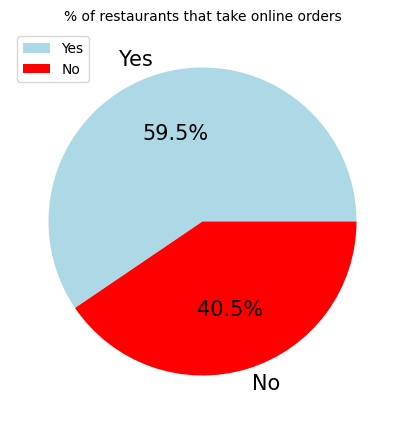

In [77]:
print(after_dropping_duplicates['online_order'].value_counts())
plt.figure(figsize=(20,5))
after_dropping_duplicates['online_order'].value_counts().plot(kind='pie',colors=['lightblue','red'],autopct='%1.1f%%',textprops={'fontsize':15})
plt.title('% of restaurants that take online orders',size=10)
plt.xlabel('',size=15)
plt.ylabel('',size=15)
plt.legend(loc=2, prop={'size': 10})


**What was the most common rating?**

Text(0, 0.5, 'rate count')

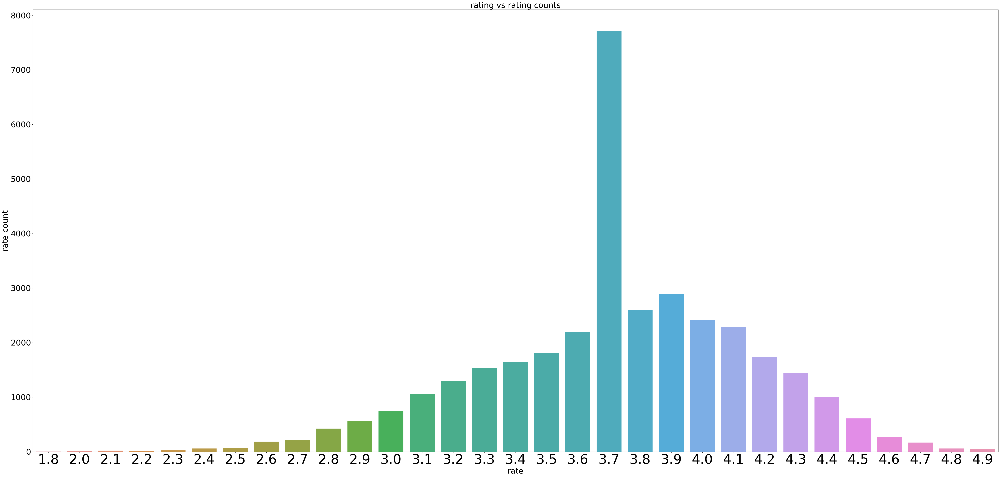

In [78]:
rate=after_dropping_duplicates.groupby(['rate']).size().reset_index().rename(columns={0:'rating_count'})
plt.figure(figsize=(65,30))
sns.barplot(x='rate',y='rating_count',data=rate)
plt.title('rating vs rating counts',size=30)
plt.xlabel('rate',size=30)
plt.xticks(fontsize=50)
plt.yticks(fontsize=30)
plt.ylabel('rate count',size=30)

**Q2-Is there any correlation between the two people’s approximated cost and a restaurant’s ratings?**

C:\Users\tarun raghuvanshi\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\tarun raghuvanshi\AppData\Local\Temp\ipykernel_4912\107370952.py:8: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(['{:,.0f}'.format(x) for x in current_values])


[Text(0, -1000.0, '-1,000'),
 Text(0, 0.0, '0'),
 Text(0, 1000.0, '1,000'),
 Text(0, 2000.0, '2,000'),
 Text(0, 3000.0, '3,000'),
 Text(0, 4000.0, '4,000'),
 Text(0, 5000.0, '5,000'),
 Text(0, 6000.0, '6,000'),
 Text(0, 7000.0, '7,000')]

<Figure size 2000x1000 with 0 Axes>

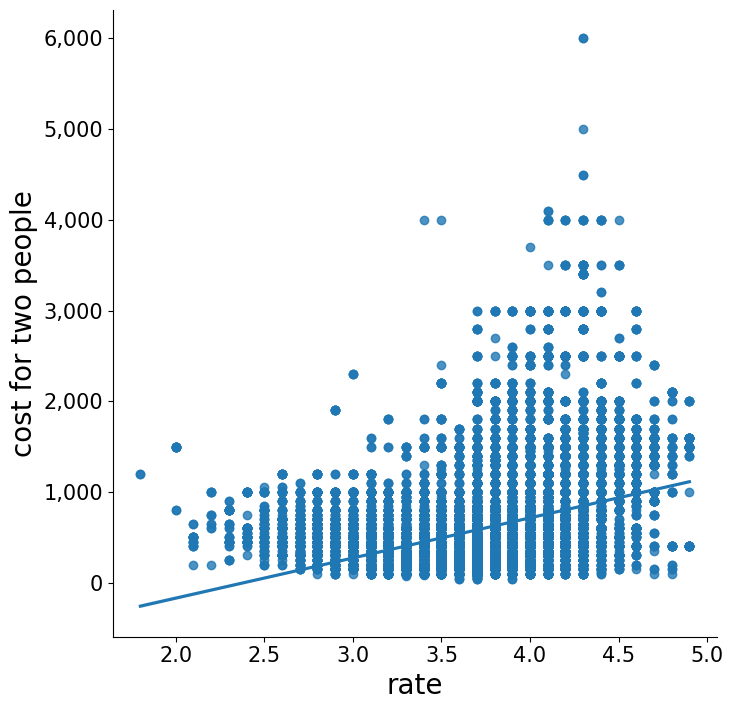

In [79]:
plt.figure(figsize=(20,10))
sns.lmplot(x='rate',y='approx_cost(for two people)',data=after_dropping_duplicates,height=7)
plt.xlabel('rate',size=20)
plt.ylabel('cost for two people',size=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
current_values = plt.gca().get_yticks()
plt.gca().set_yticklabels(['{:,.0f}'.format(x) for x in current_values])

**Q3-Top 5 cities in Bangalore that have a maximum number of high and low-rated restaurants**

In [80]:
a=after_dropping_duplicates.groupby('location')['rate'].mean().reset_index().sort_values(by='rate',ascending=False)[0:10]
print(a.head())

                 location      rate
51           Lavelle Road  4.162750
82         St. Marks Road  4.091429
45  Koramangala 5th Block  4.080468
12          Church Street  4.056152
43  Koramangala 3rd Block  4.037984


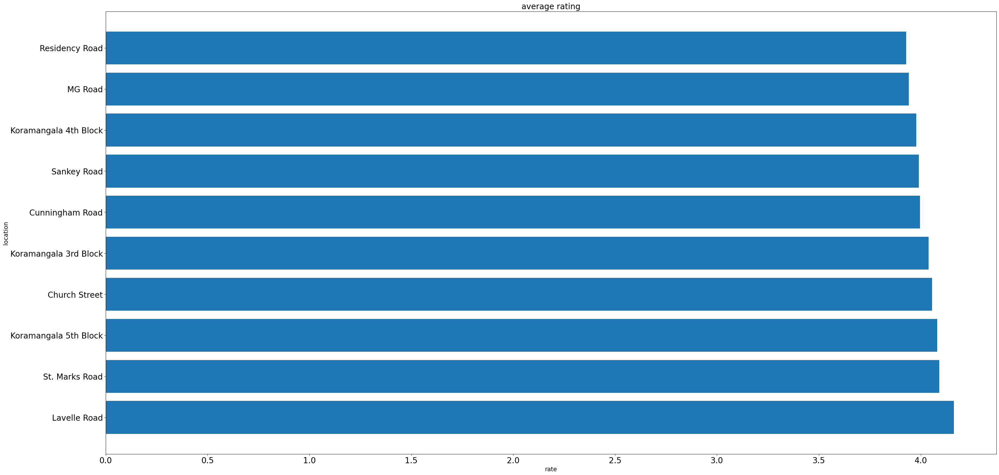

In [81]:
plt.figure(figsize=(40,20))
plt.barh(a.location,a.rate)
plt.xlabel('rate',size=15)
plt.ylabel('location',size=15)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.title('average rating',size=20)
plt.show()

**Q4-What is the average price for two people based on the type of service?**

                    rest_type  approx_cost(for two people)
51        Fine Dining, Lounge                  3000.000000
52  Fine Dining, Microbrewery                  3000.000000
50           Fine Dining, Bar                  2881.818182
49                Fine Dining                  2699.630996
11                Bar, Lounge                  2450.000000
37        Club, Casual Dining                  2400.000000
36                       Club                  2115.151515
61                Lounge, Bar                  2062.500000
13           Bar, Quick Bites                  2000.000000
64       Lounge, Microbrewery                  2000.000000


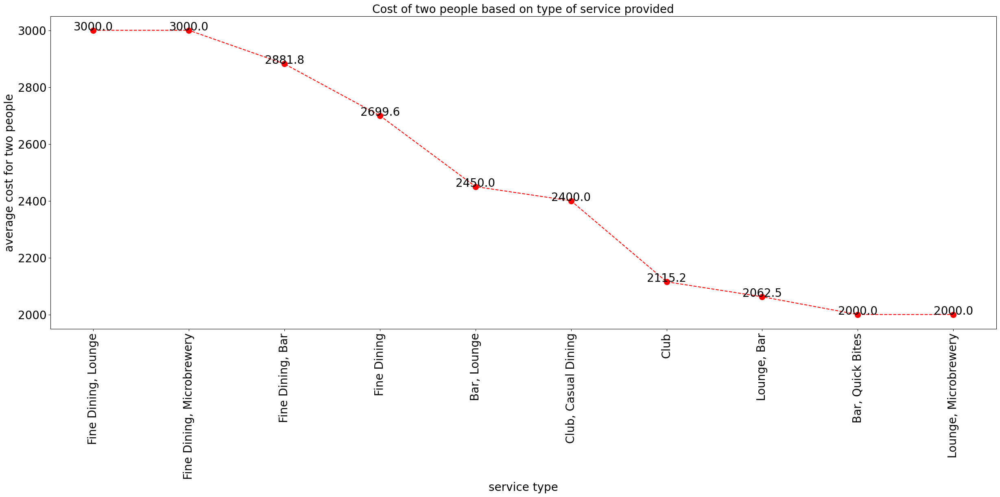

In [82]:
d=after_dropping_duplicates.groupby('rest_type')['approx_cost(for two people)'].mean().reset_index().sort_values(by='approx_cost(for two people)',ascending=False)[0:10]
print(d)
plt.figure(figsize=(30,10))
plt.plot(d['rest_type'],d['approx_cost(for two people)'],'o--r',ms=10)
plt.xlabel('service type',size=20)
plt.ylabel('average cost for two people',size=20)
plt.xticks(fontsize=20,rotation=90)
plt.yticks(fontsize=20)
plt.title('Cost of two people based on type of service provided',size=20)
for i,e in enumerate(d['approx_cost(for two people)']):
    plt.text(i,e+1,round(e,1),fontsize=20,horizontalalignment='center')
plt.show()

**Q5-What percentage of resturants book tables online?**

book_table
No     29675
Yes     5434
Name: count, dtype: int64


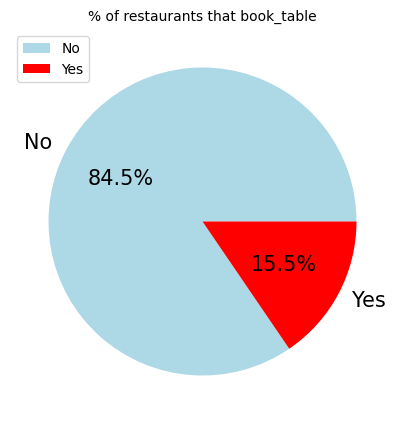

In [83]:
print(after_dropping_duplicates['book_table'].value_counts())
plt.figure(figsize=(20,5))
after_dropping_duplicates['book_table'].value_counts().plot(kind='pie',colors=['lightblue','red'],autopct='%1.1f%%',textprops={'fontsize':15})
plt.title('% of restaurants that book_table',size=10)
plt.xlabel('',size=15)
plt.ylabel('',size=15)
plt.legend(loc=2, prop={'size': 10})


**Q6-Average rating of resturants based on they take online order or not?**

  online_order      rate
0           No  3.696660
1          Yes  3.746893


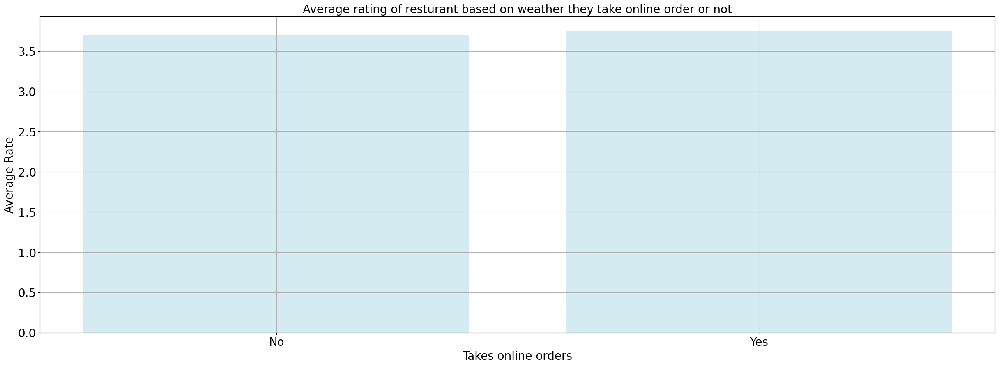

In [84]:
group1=after_dropping_duplicates.groupby('online_order')['rate'].mean().reset_index()
print(group1)
plt.figure(figsize=(30,10))
plt.bar(group1['online_order'],group1['rate'],alpha=0.5,color='lightblue')
plt.grid()
plt.xlabel('Takes online orders',size=20)
plt.ylabel('Average Rate',size=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.title('Average rating of resturant based on weather they take online order or not',size=20)
plt.show()

**Q7-What are the top 10 highest-rated restaurants?**

In [85]:
group2=after_dropping_duplicates.groupby('name')['rate'].mean().reset_index().sort_values(by='rate',ascending=False)[0:10]

In [86]:
group2

,name,rate
1264,Byg Brewski Brewing Company,4.900000
589,Asia Kitchen By Mainland China,4.900000
6505,Sant Spa Cuisine,4.900000
5890,Punjab Grill,4.871429
856,Belgian Waffle Factory,4.852381
5436,OG Variar Sons,4.800000
2576,Flechazo,4.800000
7989,The Pizza Bakery,4.800000
1278,CTR,4.750000
794,Barbecue by Punjab Grill,4.750000


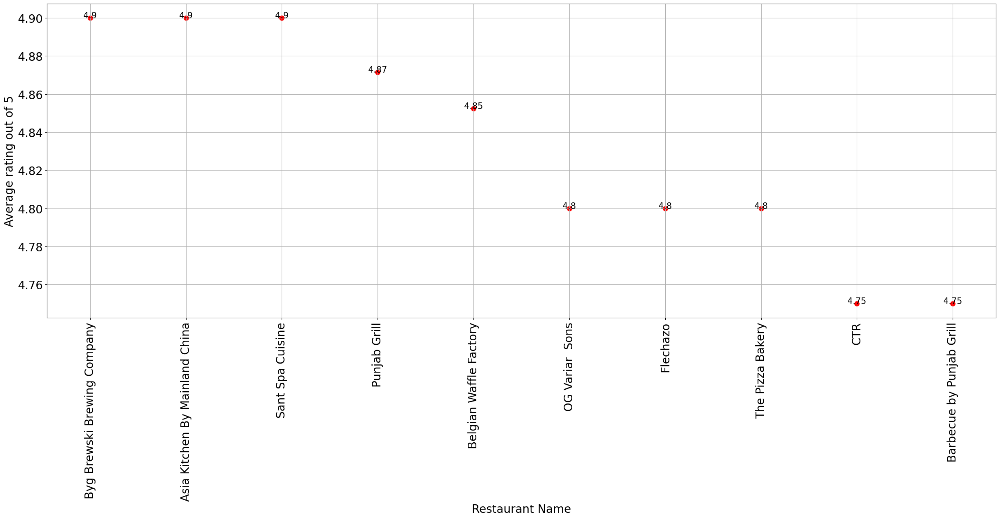

In [87]:
plt.figure(figsize=(30,10))
sns.scatterplot(x=group2.name,y=group2.rate,s=100,c='red')
for i,e in enumerate(group2.rate):
    plt.text(i,e,round(e,2),fontsize=15,horizontalalignment='center')
    plt.xlabel('Restaurant Name',size=20)
plt.ylabel('Average rating out of 5',size=20)
plt.grid()
plt.yticks(fontsize=20)
plt.xticks(fontsize=20,rotation=90)
plt.show()

**Q8-Top 10 rating of resturant those have northindian food**

In [88]:
group3=after_dropping_duplicates[after_dropping_duplicates['cuisines'] == "North Indian"][0:10]

In [89]:
group3.groupby("name")[['rate']].mean().sort_values(by='rate',ascending=False)[0:10]

,rate
name,
Mini Punjabi Dhaba,4.2
Timepass Dinner,3.8
Foodlieious Multi Cuisine,3.7
Petoo,3.7
Spicy Tandoor,3.7
Krishna Sagar,3.5
Katriguppe Donne Biryani,3.2
Atithi Point Ande Ka Funda,3.1
Nandhini Deluxe,2.6


([0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
 [Text(0, 0, 'Timepass Dinner'),
  Text(1, 0, 'Petoo'),
  Text(2, 0, 'Spicy Tandoor'),
  Text(3, 0, 'Krishna Sagar'),
  Text(4, 0, 'Nandhini Deluxe'),
  Text(5, 0, 'Katriguppe Donne Biryani'),
  Text(6, 0, 'Atithi Point Ande Ka Funda'),
  Text(7, 0, 'Foodlieious Multi Cuisine'),
  Text(8, 0, 'Mini Punjabi Dhaba'),
  Text(9, 0, 'Dal Tadkaa')])

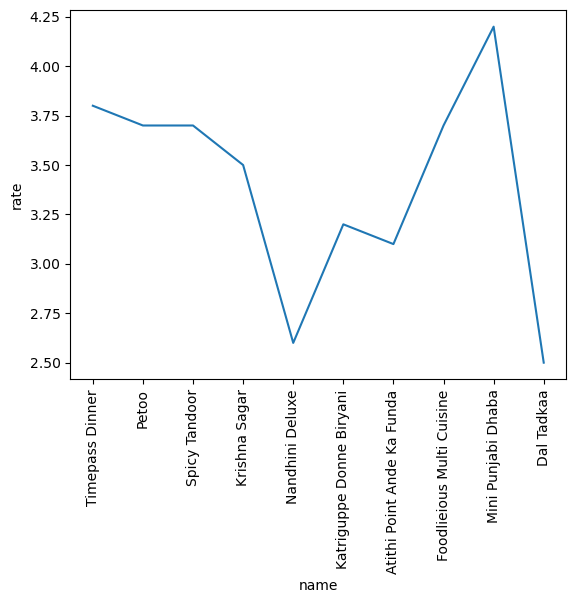

In [90]:
sns.lineplot(x='name',y='rate',data=group3)
plt.xticks(size=10,rotation=90)

**Q9-Top 10 cheapest rating resturant those have northindian food**

In [91]:
group4=after_dropping_duplicates[after_dropping_duplicates['cuisines'] == "North Indian"][0:10]

In [92]:
group4.groupby("name")[['rate']].mean().sort_values(by='rate',ascending=True)[0:10]

,rate
name,
Dal Tadkaa,2.5
Nandhini Deluxe,2.6
Atithi Point Ande Ka Funda,3.1
Katriguppe Donne Biryani,3.2
Krishna Sagar,3.5
Foodlieious Multi Cuisine,3.7
Petoo,3.7
Spicy Tandoor,3.7
Timepass Dinner,3.8


([0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
 [Text(0, 0, 'Timepass Dinner'),
  Text(1, 0, 'Petoo'),
  Text(2, 0, 'Spicy Tandoor'),
  Text(3, 0, 'Krishna Sagar'),
  Text(4, 0, 'Nandhini Deluxe'),
  Text(5, 0, 'Katriguppe Donne Biryani'),
  Text(6, 0, 'Atithi Point Ande Ka Funda'),
  Text(7, 0, 'Foodlieious Multi Cuisine'),
  Text(8, 0, 'Mini Punjabi Dhaba'),
  Text(9, 0, 'Dal Tadkaa')])

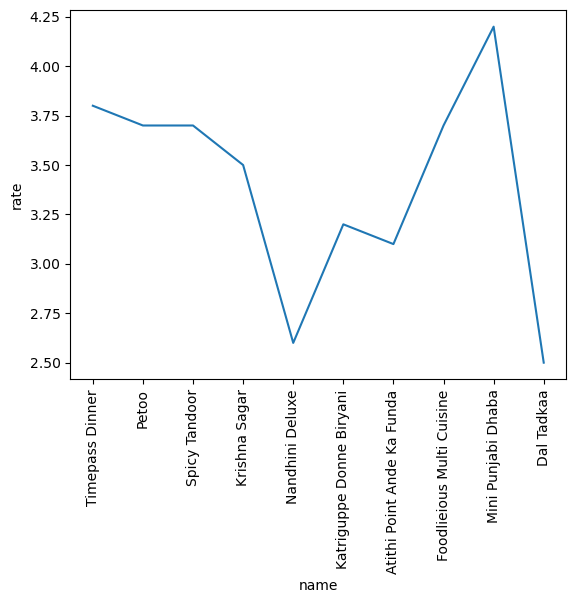

In [93]:
sns.lineplot(x='name',y='rate',data=group4)
plt.xticks(size=10,rotation=90)

**Q10-How many resturant have afghan chicken food?**

**Only one resturant have afghan chicken**

<Axes: xlabel='name', ylabel='dish_liked'>

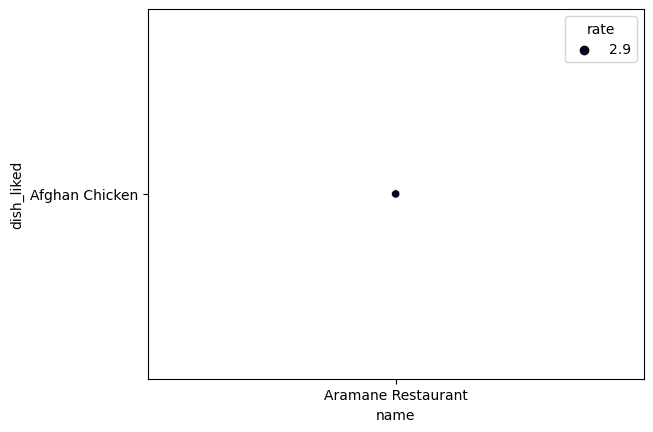

In [94]:
sns.scatterplot(x='name',y='dish_liked',hue='rate',data=liked_dish,palette='rocket')

C:\Users\tarun raghuvanshi\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


([0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
 [Text(0, 0, 'BGs Poolside Bar  Grill'),
  Text(1, 0, 'Tipsy Bull  The Bar Exchange'),
  Text(2, 0, 'Vapour Brewpub and Diner'),
  Text(3, 0, 'The Irish House'),
  Text(4, 0, 'Chilis American Grill  Bar'),
  Text(5, 0, 'Sharaab Factory'),
  Text(6, 0, 'Punjabi Times'),
  Text(7, 0, 'White Horse Pulse Resto Bar'),
  Text(8, 0, 'Atithi Family Bar  Restaurant'),
  Text(9, 0, 'The Black Pearl')])

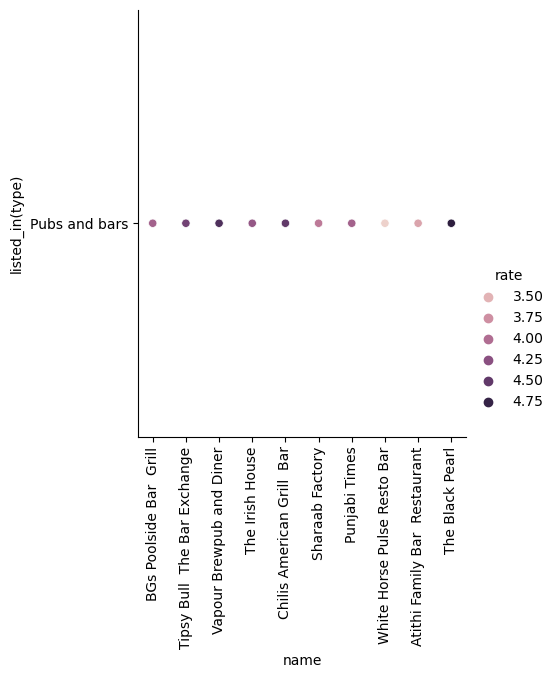

In [95]:
sns.relplot(x='name',y='listed_in(type)',hue='rate',data=all_pubs_data)
plt.xticks(size=10,rotation=90)

**Q11-How many resturant in bhanshankari**

C:\Users\tarun raghuvanshi\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


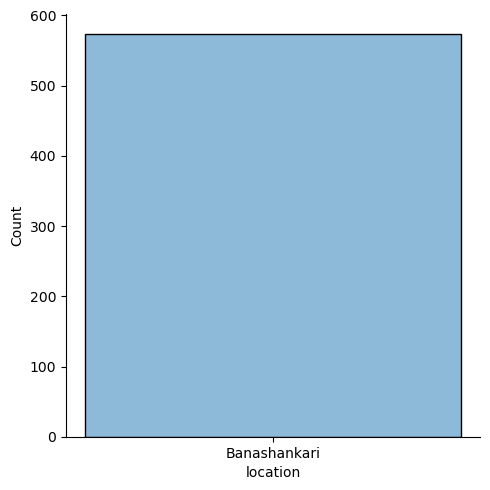

In [96]:
sns.displot(one_location_data['location'],kde=True)

In [99]:
votes_yes=after_dropping_duplicates[after_dropping_duplicates['online_order']=="Yes"]['votes']
trace0=go.Box(y=votes_yes,name="accepting online orders")
marker=dict(color='rgb(214,12,140)',)
votes_no=after_dropping_duplicates[after_dropping_duplicates['online_order']=="No"]['votes']
trace1=go.Box(y=votes_no,name="Not accepting online orders")
marker=dict(color='rgb(0,128,128)',)
layout=go.Layout(title="Box plots of votes",width=800,height=500)
data=[trace0,trace1]
fig=go.Figure(data=data,layout=layout)
py.iplot(fig)